# AMICA
## Artificial Musical Intelligence - Composer Assistant

*Exploring new ways of computer music generation*

# AI and Music

Musical composition based on Mathematical Processes.

- 20st century composers were familiar with mathematical principles.
- Markov Models, Game Theory.

### Joseph Schillinger created the Schillinger System of Musical Composition.
- Systematic and non-genre specific approach
- Descriptive rather than prescriptive grammar of music

#### How can we use this 100-year old system in modern-day technology?

# Machine Learning Perspective

We need parameters that tell something significant about the music data.

### What makes music characteristic? 
We need to abstract music to its most primitive elements.

# Schillinger's Grid System

### Theory of Melody
Graph the melody (contour)

<img src="img/schillinger-1.png" width="600">

### Theory of Melody

#### Melody Axis

Give directional values to each midi note.
<img src="img/schillinger-2.png" width="400">

Balancing or unbalancing.
<img src="img/schillinger-3.png" width="400">

### Theory of Rhythm

t = 8th note (can be changed).
<center>
<img src="img/schillinger-4.png" width="400">
<p>3 + 1 + 2 + 2 + 1 + 1 + 1 + 1 + 4</p>
<img src="img/notes-ex-1.png" width="400">
</center>

### Motion
*Parsons code for melodic contours*

#### First-order melodic contour
*Comparing 2 notes*
<img src="img/motion2.png" width="400">

### Motion


#### Second-order melodic contour
*Comparing 2 notes, acknowledging pitch conjunction*
<img src="img/motion-1.png" width="600">

### Motion

#### Third-order melodic contour
*Comparing 3 notes*
<img src="img/motion-3.png" width="600">

# Machine Learning

<h3>1. Collect Dataset</h3>
<h3>2. Prepare Dataset</h3>
<h3>3. Create Model</h3>
<h3>4. Test Model</h3>
<i>(review model's performance, tweak hyper parameters)</i>




## 1. Collect Dataset

### Margaret Greentree 
    has self-handedly digitized 402 chorales.
    It's a very complete collection of Bach's chorales.
    This is an exceptionally large, detailed dataset!

In [169]:
import music21 as m21
chorales = m21.corpus.getBachChorales(fileExtensions='xml')
print("Chorales: {}".format(len(chorales)))

Chorales: 402


In [170]:
# PREPARE DATASET FUNCTIONS

import subprocess
import IPython

m21.environment.set("musescoreDirectPNGPath", "/usr/bin/musescore")
def get_stream(file):
    return m21.converter.parse(file)

def midi_to_wav(file_name):
    subprocess.call(["timidity", "-Ow", "-o", file_name + ".wav", file_name + ".mid"])
    
def stream_to_midi(stream):
    midi = m21.midi.translate.streamToMidiFile(stream)
    midi.open(stream.metadata.title + ".mid", "wb")
    midi.write()
    midi.close()
    midi_to_wav(stream.metadata.title)

## 2. Prepare Dataset

In [171]:
from tqdm import tqdm
import os
import pickle

BACH_DATASET = "filtered_bach_chorales.pickle"

def filter_dataset(file_list, num_voices=4):
    new_files = []
    for i, file in tqdm(enumerate(file_list), total=len(chorales), desc="Filtering"):
        stream = m21.converter.parse(file)
        if len(stream.parts) == num_voices:
            new_files.append(file)
    return new_files

def load_dataset(file_name):
    """ Load chorale dataset (if already filtered, then open pickle) """
    if(os.path.isfile(file_name)):
        filtered_chorales = pickle.load(open(file_name, "rb"))
    else:
        filtered_chorales = filter_dataset(chorales)
        pickle.dump(filtered_chorales, open(file_name, "wb"))
    return filtered_chorales

filtered_chorales = load_dataset(BACH_DATASET)
print("Total chorales: {}".format(len(filtered_chorales)))


Total chorales: 357


## Visualization

### Score

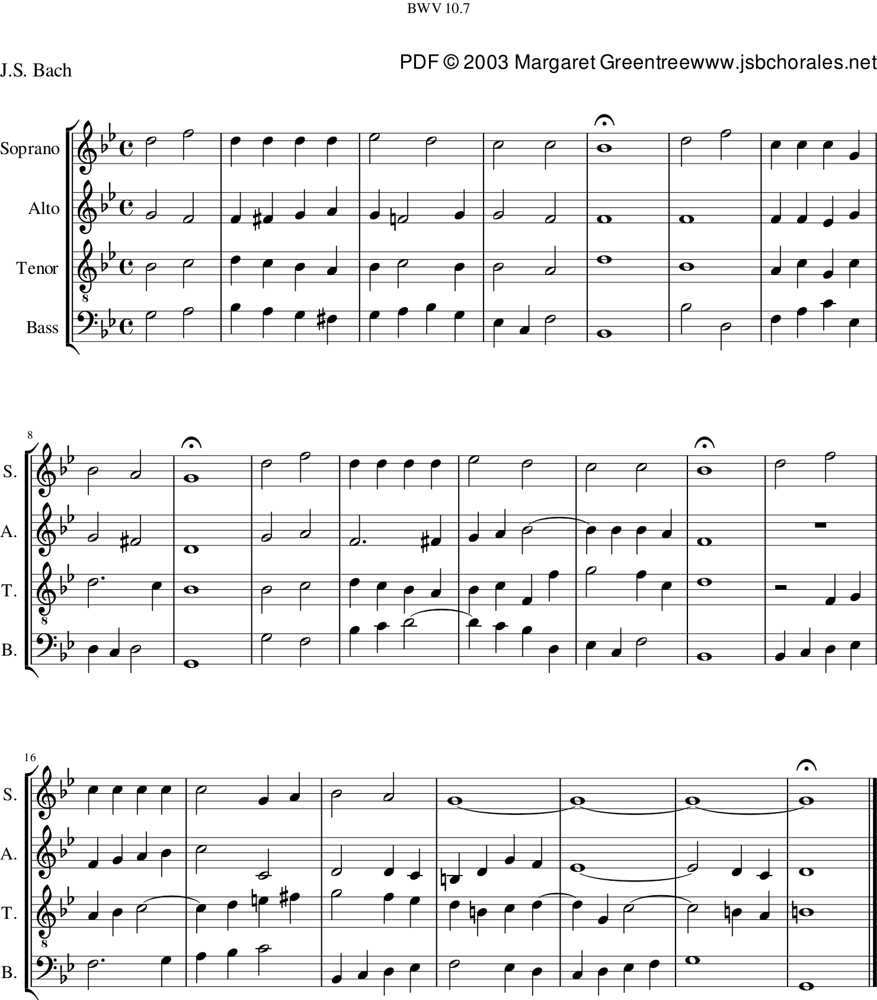

In [172]:
test_stream = get_stream(filtered_chorales[0])

test_stream.show()

stream_to_midi(test_stream)
IPython.display.Audio(test_stream.metadata.title + ".wav")

## Visualization

### Chordified

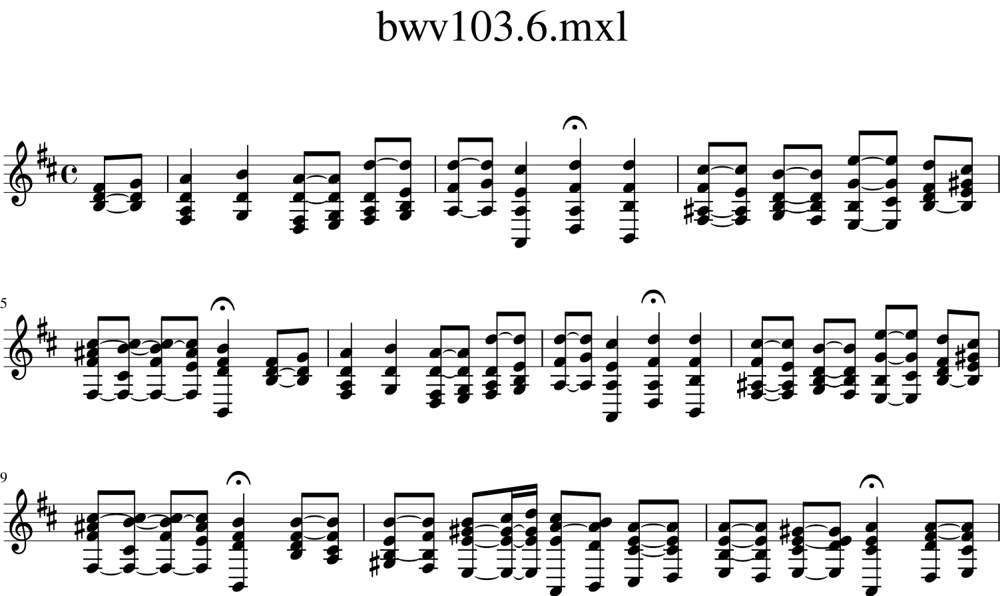

In [185]:
test_stream = get_stream(filtered_chorales[3])
test_stream.chordify().show()

stream_to_midi(test_stream)
IPython.display.Audio(test_stream.metadata.title + ".wav")

# Quick recap:

- Music and AI: Musical composition based on *Mathematical Processes*.
- We now need to do the real pre-processing of our dataset.
- Machine Learning Perspective:
    - We need parameters that tell something *significant* about the music data.

## Formatting the Musical Data
*Using tuples*

$$ (V_{1}, V_{2}, V_{3}, V_{4}, S) $$

- Each entry in a tuple is a *list*.
- The *V*'s are a list of notes of each voice in the part.
- S represents a list of subdivision counts (a metronome).

#### Using a subdivision (quantize each measure; quarter-note/SUBDIVISION)
SUBDIVISION = 4

In [174]:
SUBDIVISION = 4
NOTE_SLUR = "__"
REST = "0"

test_stream = get_stream(filtered_chorales[1])

def format_stream(stream):
    parts = []
    sub = []
    for part in stream.parts:
        part_notes = []
        notes_list = part.flat.notesAndRests
        for item in notes_list:
            if(item.isNote):
                part_notes.append(item.pitch.midi)
                for n in range(int(item.duration.quarterLength * SUBDIVISION)-1):
                    part_notes.append(NOTE_SLUR)
                    
            else:
                part_notes.append(REST)
                for n in range(int(item.duration.quarterLength * SUBDIVISION)-1):
                    part_notes.append(REST)
        parts.append(part_notes)
        
    total_length = stream.duration.quarterLength
    sub = []
    for t in range(int(total_length)):
        for i in range(1, SUBDIVISION+1):
            sub.append(i)
    parts.append(sub)
    return tuple(parts)


In [175]:
FORMATTED_DATASET = "formatted_bach_chorales.pickle"

def format_dataset(filtered_chorales):
    formatted_streams = []
    for chorale in tqdm(filtered_chorales):
        formatted_streams.append(format_stream(get_stream(chorale)))
    return formatted_streams  

def load_formatted_dataset(file_name, chorales):
    """ Load formatted chorale dataset (if already formatted, then open pickle) """
    if(os.path.isfile(file_name)):
        formatted_chorales = pickle.load(open(file_name, "rb"))
    else:
        formatted_chorales = format_dataset(chorales)
        pickle.dump(formatted_chorales, open(file_name, "wb"))
    return formatted_chorales


# Format our filtered chorales
formatted_chorales = load_formatted_dataset(FORMATTED_DATASET, filtered_chorales)


### Example: First bar of first BWV

In [176]:
def get_formatted_chorale(idx, l=-1):
    if(l == -1):
        print(formatted_chorales[idx][0])
        print(formatted_chorales[idx][1])
        print(formatted_chorales[idx][2])
        print(formatted_chorales[idx][3])
        print(formatted_chorales[idx][4])
    else:
        print(formatted_chorales[idx][0][0:l])
        print(formatted_chorales[idx][1][0:l])
        print(formatted_chorales[idx][2][0:l])
        print(formatted_chorales[idx][3][0:l])
        print(formatted_chorales[idx][4][0:l])    

[69, '__', '__', '__', 71, '__', '__', '__', 71, '__', '__', '__', 69, '__', '__', '__']
[64, '__', '__', '__', 64, '__', '__', '__', 64, '__', '__', '__', 64, '__', '__', '__']
[61, '__', '__', '__', 59, '__', 57, '__', 56, '__', '__', '__', 57, '__', '__', '__']
[57, '__', '__', '__', 56, '__', 54, '__', 52, '__', 50, '__', 49, '__', '__', '__']
[1, 2, 3, 4, 1, 2, 3, 4, 1, 2, 3, 4, 1, 2, 3, 4]


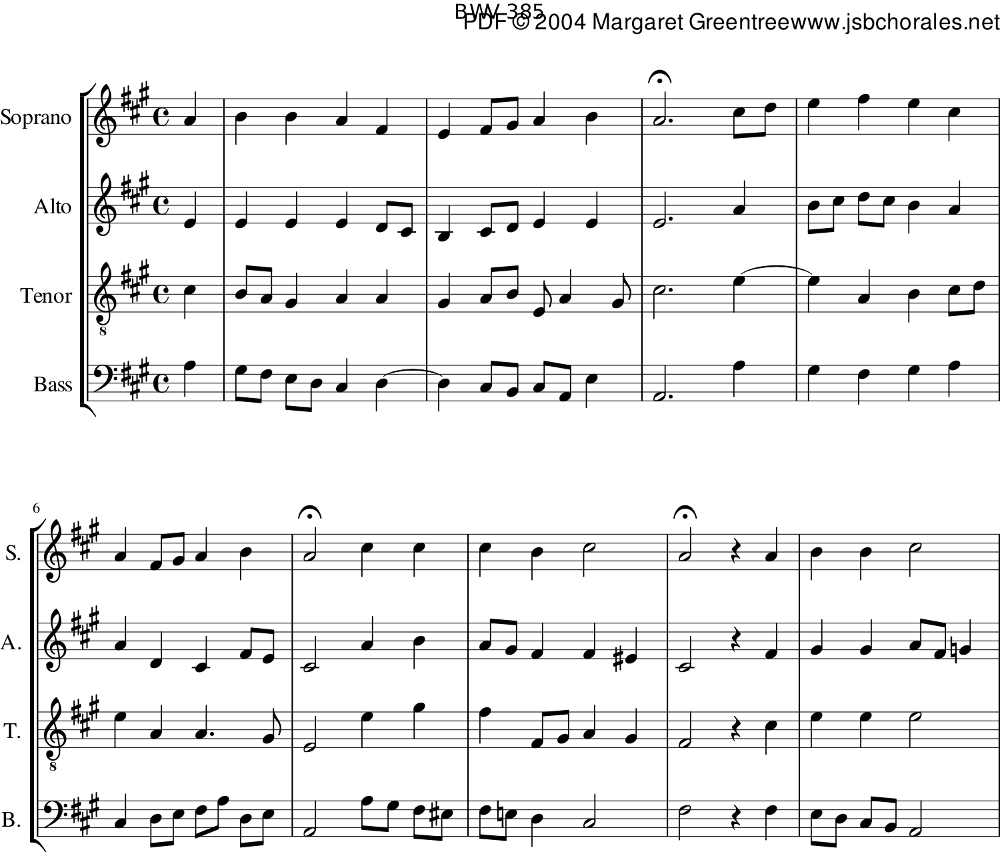

In [177]:
idx= 255
get_formatted_chorale(idx, 16)
get_stream(filtered_chorales[idx]).show()

# Building the Model

##### *Before we get into the RNN's, a quick intro to ANN's!*
### A really quick introduction to Neural Networks
*Artificial neural networks (ANN) are software implementations of the neuronal structure of our brains.*

Brain contains neurons, kind of like organic switches. An AI is made of one or more ANN's.

<center>
    <img src="img/ann-1.gif" width="500">
</center>

### Biological Neuron vs. Artificial Neuron (AN)

1. Dendrite - Receives signals from other neurons.
2. Cell body (Soma) - Sums all incoming signals to generate output.
3. Axon - Neuron fires through the axon to other neurons if sum value >= threshold.
4. Synapse - Interconnection between neurons. Amount of signal depends on the strength (synaptic weights) of the connections.

*Highly, highly interconnected.*

<center>
    <img src="img/biological-neuron.jpg" width="800"/>
</center>

#### Biological neurons are simulated in an AN by an *activation function*.

*transfer function* = sum
<center>
    <img src="img/artificial-neuron-1.png" width="400"/>
</center>

Once the input is greater than a value => output changes state.
*(i.e. from 0 to 1)*

#### Sigmoid function:
$$ f(z) = \frac{1}{1 + exp(-z)} $$

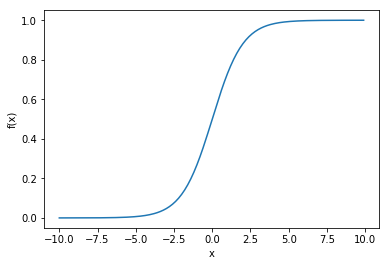

In [178]:
# SIGMOID ACTIVATION

%matplotlib inline
import matplotlib.pylab as plt
import numpy as np
x = np.arange(-10, 10, 0.1)
f = 1 / (1 + np.exp(-x))
plt.plot(x, f)
plt.xlabel('x')
plt.ylabel('f(x)')
plt.show()

### Nodes
ANN's are also hierarchically connected. Outputs of neurons can be inputs of others. We call them:

*Connected layers of Nodes*

1. Every node takes multiple *weighted* inputs.
2. It applies the activation function to the summation of these inputs.
3. Generates an output.

$$ weighted\,inputs = x_{1}w_{1} + x_{2}w_{2} + x_{3}w_{3} + b $$

<center>
    <br/>
    Weights are variables that are changed during the training/learning process.
<img src="img/nodes-1.jpg" width="400">
    </center>

### Bias

Consider only one node. Let's apply a few weights to the input:

<center>
    <img src="img/nodes-2.jpg" width="400">
</center>

In [179]:
def sigmoid(weights, bias=0):
    if(bias == 0):
        for w in weights:
            f = 1 / (1 + np.exp(-(x*w+bias)))
            plt.plot(x, f, label="weight = " + str(w))
    else:
        for b in bias:
            f = 1 / (1 + np.exp(-(x*weights[0]+b)))
            plt.axvline(x=b, color='red')
            plt.plot(x, f, label="bias = " + str(b))
            
    plt.xlabel('x')
    plt.ylabel('h_w(x)')
    plt.legend(loc=2)


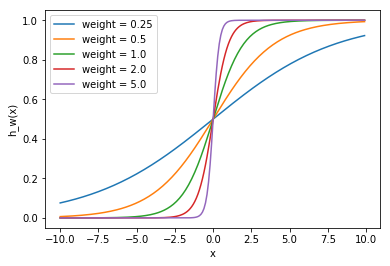

In [180]:
sigmoid([0.25, 0.5, 1.0, 2.0, 5.0])
plt.show()

### Problem:

What if we only want the output to change when x is greater than 2.5?
Bias! :)

<center>
    <img src="img/nodes-3.png" width="300">
</center>



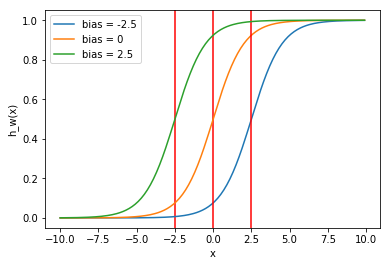

In [181]:
sigmoid([1.0], bias=[-2.5, 0, 2.5])
plt.show()

### Connecting the dots
Common NN structure:
- Layer 1: Input layer
- Layer 2: Hidden layer
- Layer 3: Output layer

<center>
    <img src="img/nn-1.png" width="300">
</center>


### What's the purpose?

<b>The goal is to train the neural network so it can correctly predict an output from a given input.</b>

#### Recap:
This is performed by varying the weights so as to minimize the error. 


*But how do we know how to vary the weights?*

#### Gradient descent!

Change *w* to get the minimal error.

*Gradient*: Slope of the error curve at a point (x,y).

*Gradient Descent* = Descending to the most minimal slope of the error curve.

<center>
    <img src="img/gradient-descent.gif" width="800">
</center>


### Back to the Networks:
#### Recurrent Neural Networks
- Densely connected neural network.
- Key difference to normal Feed Forward Networks: *time*.
- Output of Hidden Layer is fed back into itself.

<img src="img/rnn-1.png" width="800">

### RNN Problems
- Vanishing gradient problem. 
- We want "longer memories"
- Connect data relationships at significant distances in time.

*Multiply many sigmoid gradients together (close to zero) – this leads to a vanishing gradient*
- When gradient is near-zero, the weights won't be adjusted.
- Consequence: network won't learn new relationships.

#### - More timesteps => back-propagation gradients either;
- Accumulate and explode or vanish down to nothing.

### Solutions:

Another activation function: *ReLU*

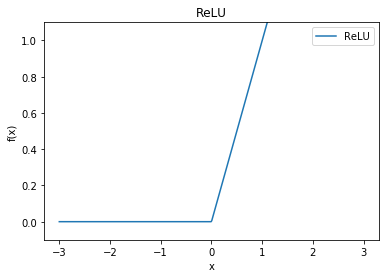

In [182]:
x  = np.linspace(-3, 3, 500)
y = (x + abs(x)) / 2
plt.plot(x, y)

plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('ReLU')
plt.legend(['ReLU'])

plt.ylim([-0.1, 1.1])
plt.show()

### Long-Short Term Memory Network

- Creates an internal memory state which is added to the processed input.

# (Really) Building the Model

<img src="img/tensorflow.png" width="300">

Open-Source software library for Machine Intelligence created by Google.

# What happens right now.
## Music Generation


### Recent Startups:
<a href="http://ampermusic.com"><img src="img/amper-music.jpg" width="300"/></a>

<a href="http://aiva.ai"><img src="img/aiva.png" width="300"/></a>

<a href="http://jukedeck.com"><img src="img/jukedeck.png" width="300"/></a>


### Powered by SonyCSL:
<a href="http://www.flow-machines.com/"><img src="img/sonycsl.png" width="800"/></a>

<a href="https://www.musicbusinessworldwide.com/welcome-future-spotify-poaches-ai-music-expert-sony/"><img src="img/spotify.png" width="300"/></a>


### What we should really look out for:

#### Royalty Free => AI-Driven Music

### AI Music cloud API
<img src="img/amper-api.png" width="800"/>


### AI Music within Adobe Premiere
<img src="img/amper-adobe.png" width="800"/>

# So what's the Catch?

## Overfitting
*"The production of an analysis that corresponds too closely or exactly to a particular set of data, and may therefore fail to fit additional data or predict future observations reliably."*

- Generated output resembles input dataset too much.
- It's not new - it copies huge chunks of several inputs and combines it.

### Why:
Examples from AIVA, AmperMusic and JukeDeck are:
- *WAY ahead* of the output of the state-of-the-art deep learning models for music generation, therefore;
- I personally do not believe their models are as sophisticated (yet!) as their outputs.

# Sound and Performance

### NSynth
<a href="https://experiments.withgoogle.com/ai/sound-maker/view/"><img src="img/nsynth.png" width="600"/></a>
### A.I. Duet
<a href="https://experiments.withgoogle.com/ai/ai-duet/view/"><img src="img/ai-duet.png" width="600"/></a>

### Neural Translation of Musical Style
<a href="http://imanmalik.com/cs/2017/06/05/neural-style.html"><img src="img/neural-translation.png" width="600"/></a>

### Raspberry Pi AI Piano (nice project to familiarize yourself with music and AI!)
<a href="https://rpiai.com/piano/"><img src="img/raspberry-pi.jpg" width="600"/></a>

# What I'll be doing over the next few years

### 1. Start Master at HKU.
<img src="img/hku.png" width="300"/>

### 2. Start Master AI at University of Amsterdam
#### Start research at Music Cognition Group with Henkjan Honing, Ashley Burgoyne
<img src="img/uva.jpg" width="500"/>


## 3. Start a new Music Technology company
*I really like thinking of new ways to profoundly change the way we experience things :)* 
### Hard- and software products:
#### - A new sampler, incorporating instrument synthesis aided by AI.
    - (Kontakt's got way too much of a monopoly in the sampler-business, you know!)
#### - A new breed of synthesizers; not very sure how yet, but I am inspired by NSynth.

## 4. Write Music :)

<center>
    <img src="img/meme.jpg" width="400"/>
    <h1>Questions? :)</h1>
</center>